## The Dataset
This is a dataset with more than 1,6 Millions occurrences on accidents in UK between 2005 and 2014, it's public data published by the government that can be found on Kaggle and on the their official website !

### Features
1. Accident_Index: unique ID of the accident

2. Location_Easting_OSGR: east coordinate of the accident position, using the Ordnance Survey Grid Reference

3. Location_Northing_OSGR: north coordinate of the location of the accident, using the Ordnance Survey Grid Reference

4. Longitude: longitude of the accident location

5. Latitude: latitude of the accident location

6. Police_Force: police force responsible for the accident

7. Accident_Severity: severity of the accident

8. Number_of_Vehicles: number of vehicles involved in the accident

9. Number_of_Casualties: number of people injured or killed in the accident

10. Date: date of the accident

11. Day_of_Week: day of the week of the accident (1 = Sunday, 2 = Monday, ..., 7 = Saturday)

12. Time: time of the accident

13. LocalAuthority(District): local authority responsible for the area where the accident took place

14. LocalAuthority(Highway): local authority responsible for the road where the accident took place

15. 1st_Road_Class: class of the first road involved in the accident (1 = highway, 2 = A road, 3 = B road, 4 = other road)

16. 1st_Road_Number: number of the first road involved in the accident

17. Road_Type: type of road where the accident occurred (Roundabout, One way street, Dual carriageway, Single carriageway)

18. Speed_limit: speed limit on the road where the accident occurred

19. Junction_Detail: detail of the junction where the accident occurred

20. Junction_Control: type of control of the junction where the accident occurred

21. 2nd_Road_Class: class of the second road involved in the accident

22. 2nd_Road_Number: number of the second road involved in the accident

23. Pedestrian_Crossing-Human_Control: type of human control for the crosswalks where the accident occurred

24. Pedestrian_Crossing-Physical_Facilities: type of physical facility for the crosswalk where the accident occurred

25. Light_Conditions: lighting conditions where the accident occurred

26. Weather_Conditions: weather conditions where the accident occurred

27. Road_Surface_Conditions: road surface conditions where the accident occurred

28. Special_Conditions_at_Site: special conditions at the site where the accident occurred

29. Carriageway_Hazards: hazards on the roadway where the accident occurred

30. Urban_or_Rural_Area: urban or rural area where the accident occurred

31. Did_Police_Officer_Attend_Scene_of_Accident: indicates if the Police attended the scene or not

32. LSOA_of_Accident_Location

33. Year

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns

In [2]:
df1 = pd.read_csv('accidents_2005_to_2007.csv', low_memory=False)
df2 = pd.read_csv('accidents_2009_to_2011.csv', low_memory=False)
df3 = pd.read_csv('accidents_2012_to_2014.csv', low_memory=False)

In [3]:
# Concatenate the DataFrames vertically (row-wise)
df_all = pd.concat([df1, df2, df3], axis=0)

# Reset the index of the concatenated DataFrame
df_all.reset_index(drop=True, inplace=True)

In [4]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43139 entries, 0 to 43138
Data columns (total 33 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Accident_Index                               43139 non-null  object 
 1   Location_Easting_OSGR                        43139 non-null  int64  
 2   Location_Northing_OSGR                       43139 non-null  int64  
 3   Longitude                                    43139 non-null  float64
 4   Latitude                                     43139 non-null  float64
 5   Police_Force                                 43139 non-null  int64  
 6   Accident_Severity                            43139 non-null  int64  
 7   Number_of_Vehicles                           43139 non-null  int64  
 8   Number_of_Casualties                         43139 non-null  int64  
 9   Date                                         43139 non-null  object 
 10

In [5]:
df_all.columns

Index(['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
       'Longitude', 'Latitude', 'Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties', 'Date', 'Day_of_Week',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       'Junction_Detail', 'Junction_Control', '2nd_Road_Class',
       '2nd_Road_Number', 'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location', 'Year'],
      dtype='object')

In [6]:
df_all.head(3)

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year
0,200501BS00001,525680,178240,-0.191170,51.489096,1,2,1,1,04/01/2005,...,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,None,None,1.0,Yes,E01002849,2005.0
1,200501BS00002,524170,181650,-0.211708,51.520075,1,3,1,1,05/01/2005,...,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1.0,Yes,E01002909,2005.0
2,200501BS00003,524520,182240,-0.206458,51.525301,1,3,2,1,06/01/2005,...,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1.0,Yes,E01002857,2005.0


In [7]:
df_all.shape

(43139, 33)

### Data Analysis

In [8]:
# Missing Values - null
print("***Total missing values for each column:***\n", df_all.isnull().sum())

***Total missing values for each column:***
 Accident_Index                                     0
Location_Easting_OSGR                              0
Location_Northing_OSGR                             0
Longitude                                          0
Latitude                                           0
Police_Force                                       0
Accident_Severity                                  0
Number_of_Vehicles                                 0
Number_of_Casualties                               0
Date                                               0
Day_of_Week                                        0
Time                                               0
Local_Authority_(District)                         0
Local_Authority_(Highway)                          0
1st_Road_Class                                     0
1st_Road_Number                                    0
Road_Type                                          0
Speed_limit                                        1
J

In [9]:
# Missing Values -  zero
print("Total missing values for each column", (df_all == 0).sum())
## seems 0 is valid for the features '1st_Road_Number' and '2nd_Road_Number'

Total missing values for each column Accident_Index                                     0
Location_Easting_OSGR                              0
Location_Northing_OSGR                             0
Longitude                                          0
Latitude                                           0
Police_Force                                       0
Accident_Severity                                  0
Number_of_Vehicles                                 0
Number_of_Casualties                               0
Date                                               0
Day_of_Week                                        0
Time                                               0
Local_Authority_(District)                         0
Local_Authority_(Highway)                          0
1st_Road_Class                                     0
1st_Road_Number                                12055
Road_Type                                          0
Speed_limit                                        0
Junction_

In [10]:
# Missing Values -  '..'
print("Total missing values for each column", (df_all == "..").sum())

Total missing values for each column Accident_Index                                 0
Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
Junction_Detail                                0
Junction_Control                

In [11]:
print("No of duplicate records according to Accident_Index: ", len(df_all[df_all.duplicated(subset=['Accident_Index'], keep=False)]))

No of duplicate records according to Accident_Index:  0


In [12]:
print("Statistical values of categorical columns \n", df_all.describe(include= 'object').T)

Statistical values of categorical columns 
                                              count unique  \
Accident_Index                               43139  43139   
Date                                         43139   1096   
Time                                         43139   1421   
Local_Authority_(Highway)                    43139     33   
Road_Type                                    43139      6   
Junction_Control                             32447      4   
Pedestrian_Crossing-Human_Control            43138      3   
Pedestrian_Crossing-Physical_Facilities      43138      7   
Light_Conditions                             43137      5   
Weather_Conditions                           43137      9   
Road_Surface_Conditions                      43136      5   
Special_Conditions_at_Site                   43136      8   
Carriageway_Hazards                          43136      6   
Did_Police_Officer_Attend_Scene_of_Accident  42893      3   
LSOA_of_Accident_Location                

In [13]:
print("Statistical values of numerical columns \n", df_all.describe(include= 'float64' and 'int64').T)

Statistical values of numerical columns 
                               count           mean          std       min  \
Location_Easting_OSGR       43139.0  534031.863279  8631.563017  503800.0   
Location_Northing_OSGR      43139.0  181233.927073  5779.541340  156800.0   
Police_Force                43139.0       2.070980     7.013572       1.0   
Accident_Severity           43139.0       2.907624     0.291872       1.0   
Number_of_Vehicles          43139.0       1.765873     0.607633       1.0   
Number_of_Casualties        43139.0       1.171840     0.523081       1.0   
Day_of_Week                 43139.0       4.116832     1.900091       1.0   
Local_Authority_(District)  43139.0      23.417186    83.839431       1.0   
1st_Road_Class              43139.0       3.783120     1.161681       1.0   
1st_Road_Number             43139.0     525.652727  1109.515104       0.0   

                                 25%       50%       75%       max  
Location_Easting_OSGR       528940.0  533

### Data Preprocessing for null values

#### Drop columns with null values

In [14]:
## Drop columns with many missing values
# Get the column names where the count of null values is greater than 10000
columns_to_drop = df_all.columns[df_all.isnull().sum() > 10000]

# Drop the columns from the dataframe
df_all_drop = df_all.drop(columns=columns_to_drop)

In [15]:
# Drop the duplicate records based on the specified column
df_all_drop.drop_duplicates(subset=['Accident_Index'], keep='first', inplace=True)

In [16]:
df_all_drop.shape, df_all_drop.head(3)

((43139, 31),
   Accident_Index  Location_Easting_OSGR  Location_Northing_OSGR  Longitude  \
 0  200501BS00001                 525680                  178240  -0.191170   
 1  200501BS00002                 524170                  181650  -0.211708   
 2  200501BS00003                 524520                  182240  -0.206458   
 
     Latitude  Police_Force  Accident_Severity  Number_of_Vehicles  \
 0  51.489096             1                  2                   1   
 1  51.520075             1                  3                   1   
 2  51.525301             1                  3                   2   
 
    Number_of_Casualties        Date  ...  \
 0                     1  04/01/2005  ...   
 1                     1  05/01/2005  ...   
 2                     1  06/01/2005  ...   
 
        Pedestrian_Crossing-Physical_Facilities  \
 0                               Zebra crossing   
 1  Pedestrian phase at traffic signal junction   
 2        No physical crossing within 50 meters   


In [17]:
# Missing Values - null
print("***Total missing values for each column:***\n", df_all_drop.isnull().sum())

***Total missing values for each column:***
 Accident_Index                                   0
Location_Easting_OSGR                            0
Location_Northing_OSGR                           0
Longitude                                        0
Latitude                                         0
Police_Force                                     0
Accident_Severity                                0
Number_of_Vehicles                               0
Number_of_Casualties                             0
Date                                             0
Day_of_Week                                      0
Time                                             0
Local_Authority_(District)                       0
Local_Authority_(Highway)                        0
1st_Road_Class                                   0
1st_Road_Number                                  0
Road_Type                                        0
Speed_limit                                      1
2nd_Road_Class                       

### Data Imputation

In [18]:
# Imputation for columns with null values - all are categorical
columns_to_impute = ['Pedestrian_Crossing-Human_Control', 'Pedestrian_Crossing-Physical_Facilities', 'Road_Surface_Conditions', 'Carriageway_Hazards']
# Impute null values with the mode of specified categorical columns
for column in columns_to_impute:
    mode_value = df_all_drop[column].mode()[0]
    df_all_drop[column].fillna(mode_value, inplace=True)


In [19]:
# Missing Values - null
print("***Total missing values for each column:***\n", df_all_drop.isnull().sum())

***Total missing values for each column:***
 Accident_Index                                   0
Location_Easting_OSGR                            0
Location_Northing_OSGR                           0
Longitude                                        0
Latitude                                         0
Police_Force                                     0
Accident_Severity                                0
Number_of_Vehicles                               0
Number_of_Casualties                             0
Date                                             0
Day_of_Week                                      0
Time                                             0
Local_Authority_(District)                       0
Local_Authority_(Highway)                        0
1st_Road_Class                                   0
1st_Road_Number                                  0
Road_Type                                        0
Speed_limit                                      1
2nd_Road_Class                       

In [20]:
# Drop rest null value records too
df_all_drop.dropna(inplace=True)

In [21]:
# Missing Values - null
print("***Total missing values for each column:***\n", df_all_drop.isnull().sum())

***Total missing values for each column:***
 Accident_Index                                 0
Location_Easting_OSGR                          0
Location_Northing_OSGR                         0
Longitude                                      0
Latitude                                       0
Police_Force                                   0
Accident_Severity                              0
Number_of_Vehicles                             0
Number_of_Casualties                           0
Date                                           0
Day_of_Week                                    0
Time                                           0
Local_Authority_(District)                     0
Local_Authority_(Highway)                      0
1st_Road_Class                                 0
1st_Road_Number                                0
Road_Type                                      0
Speed_limit                                    0
2nd_Road_Class                                 0
2nd_Road_Number         

# Data Visualization

### sns Pairplot

In [22]:
df_all_drop.columns

Index(['Accident_Index', 'Location_Easting_OSGR', 'Location_Northing_OSGR',
       'Longitude', 'Latitude', 'Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties', 'Date', 'Day_of_Week',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       '2nd_Road_Class', '2nd_Road_Number',
       'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'LSOA_of_Accident_Location', 'Year'],
      dtype='object')

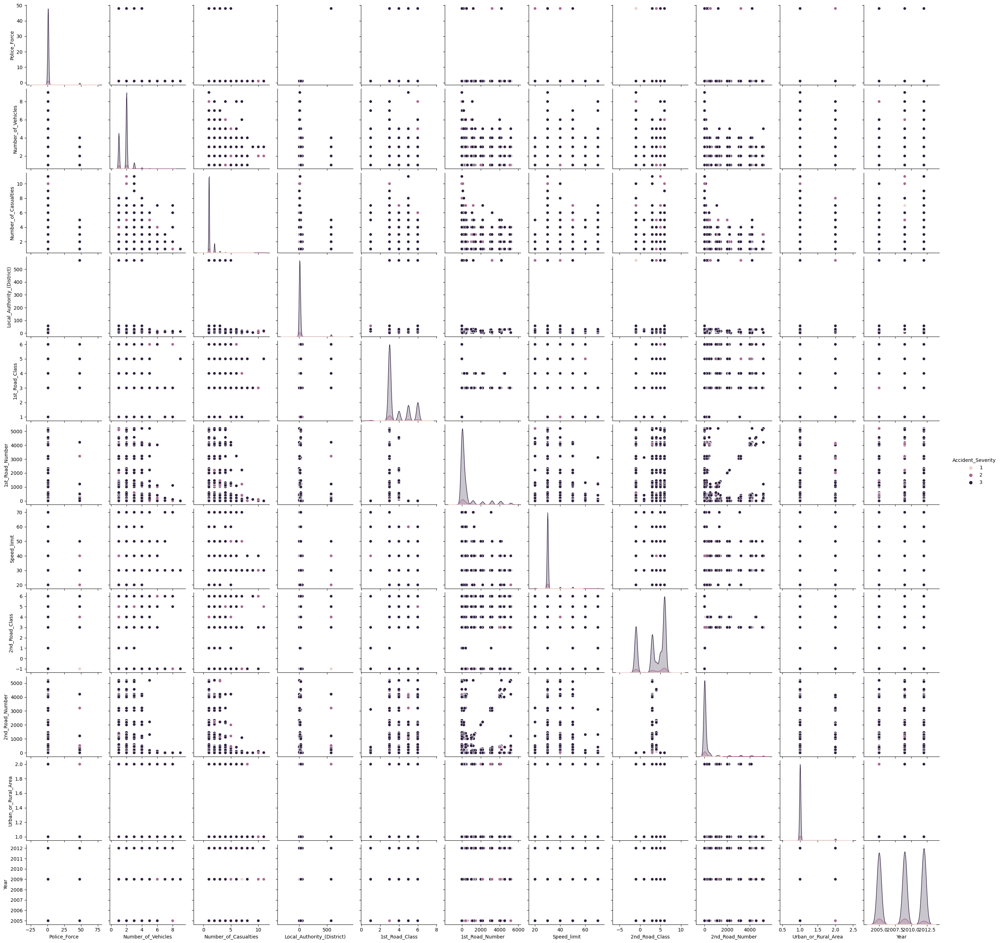

In [23]:
# Create a pair plot
columns_sns = ['Police_Force', 'Accident_Severity',
       'Number_of_Vehicles', 'Number_of_Casualties',
       'Time', 'Local_Authority_(District)', 'Local_Authority_(Highway)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       '2nd_Road_Class', '2nd_Road_Number',
       'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'Year']
sns.pairplot(df_all_drop[columns_sns], hue='Accident_Severity', diag_kind='kde')
plt.show()

### Bar plot of accident severity

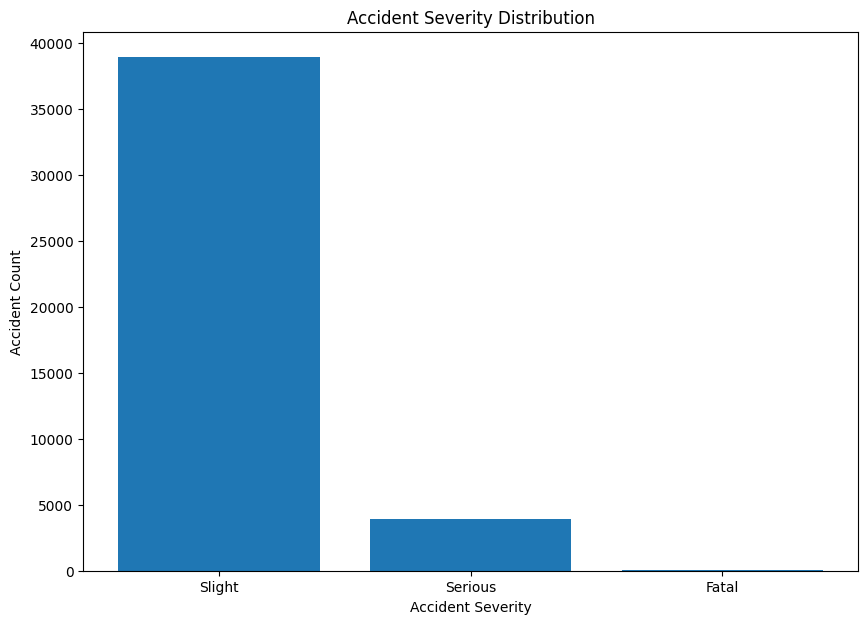

In [24]:
plt.figure(figsize=(10, 7))
severity_counts = df_all_drop['Accident_Severity'].value_counts()
severity_labels = ['Slight', 'Serious', 'Fatal']

plt.bar(severity_labels, severity_counts)
plt.xlabel('Accident Severity')
plt.ylabel('Accident Count')
plt.title('Accident Severity Distribution')
plt.show()

### Histogram of the Road_Surface_Conditions involved in accidents

In [25]:
df_all_drop['Road_Surface_Conditions'].unique()

array(['Wet/Damp', 'Dry', 'Frost/Ice', 'Snow',
       'Flood (Over 3cm of water)'], dtype=object)

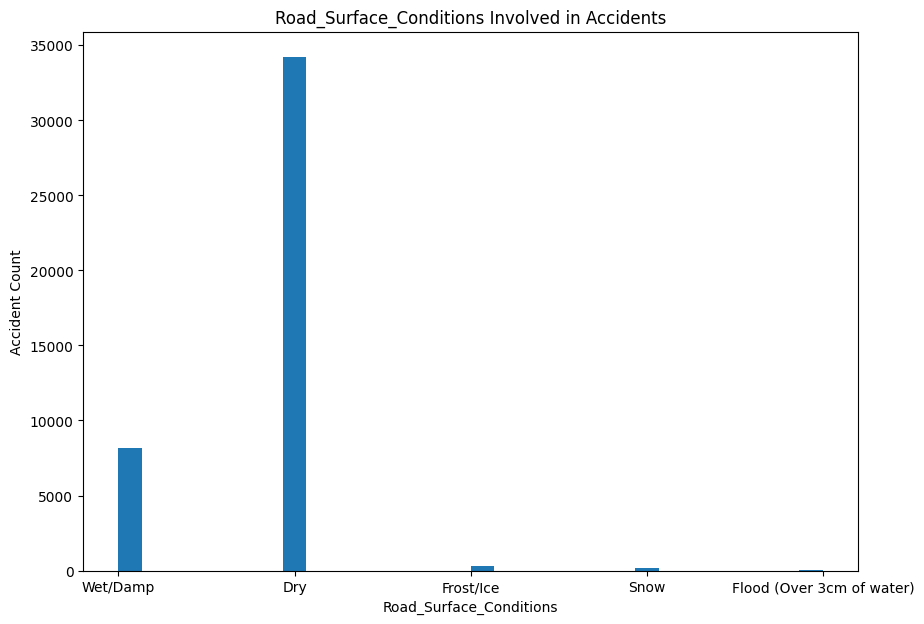

In [26]:
plt.figure(figsize=(10, 7))
plt.hist(df_all_drop['Road_Surface_Conditions'], bins=30)
plt.xlabel('Road_Surface_Conditions')
plt.ylabel('Accident Count')
plt.title('Road_Surface_Conditions Involved in Accidents')
plt.show()

In [27]:
df_all_drop['Date'] = pd.to_datetime(df_all_drop['Date'])

<ipython-input-27-276b8f30cbb1>:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df_all_drop['Date'] = pd.to_datetime(df_all_drop['Date'])


### Line plot of accidents over time

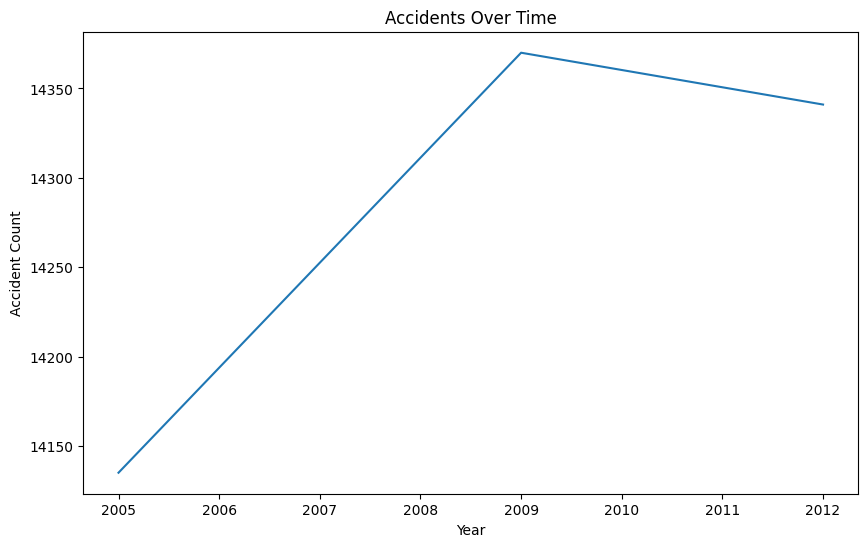

In [28]:
plt.figure(figsize=(10, 6))  # Specify the figure size
accidents_by_year = df_all_drop['Year'].value_counts().sort_index()

plt.plot(accidents_by_year.index, accidents_by_year.values)
plt.xlabel('Year')
plt.ylabel('Accident Count')
plt.title('Accidents Over Time')
plt.show()

### Pie chart of road types

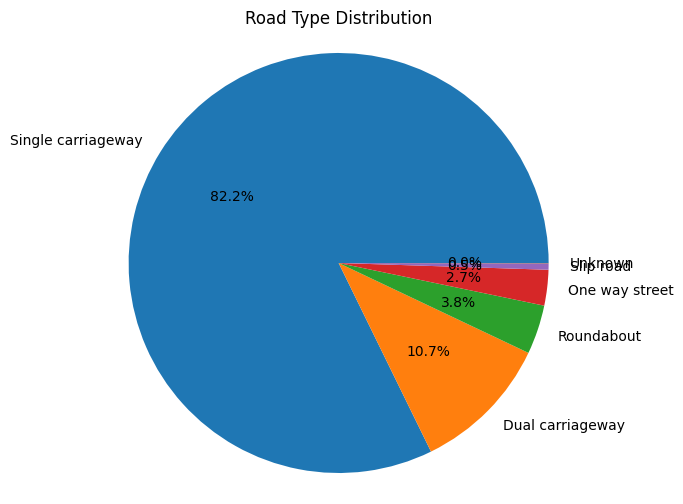

In [29]:
plt.figure(figsize=(8, 6))  # Specify the figure size
road_type_counts = df_all_drop['Road_Type'].value_counts()

plt.pie(road_type_counts, labels=road_type_counts.index, autopct='%1.1f%%')
plt.title('Road Type Distribution')
plt.axis('equal')
plt.show()

### Scatter plot of accidents based on longitude and latitude

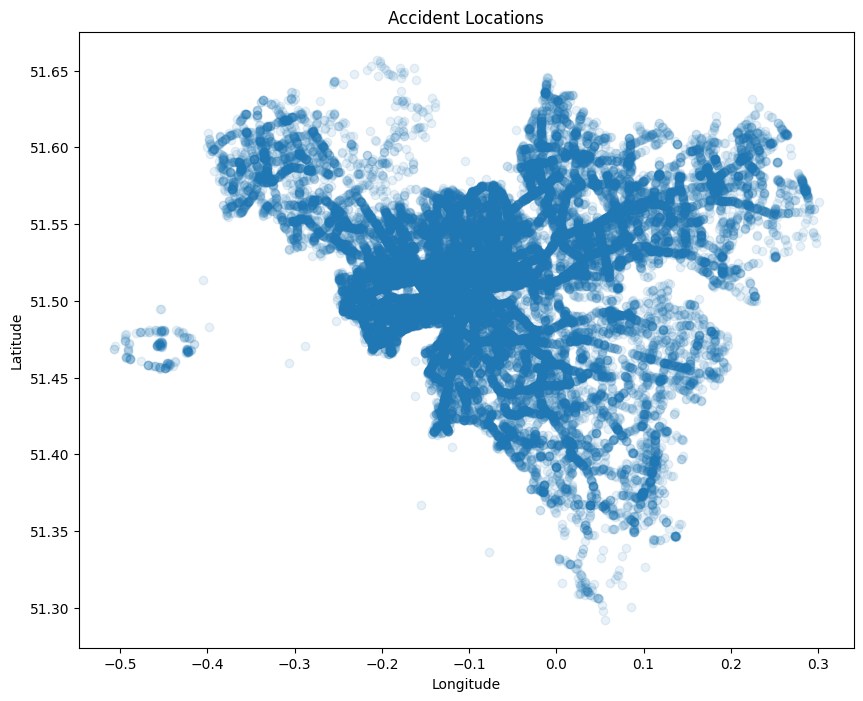

In [30]:
plt.figure(figsize=(10, 8))  # Specify the figure size
plt.scatter(df_all_drop['Longitude'], df_all_drop['Latitude'], alpha=0.1)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Accident Locations')
plt.show()

In [31]:
import folium
from folium.plugins import MarkerCluster

# Create a folium map centered around the mean latitude and longitude
map_center = [df_all_drop['Latitude'].mean(), df_all_drop['Longitude'].mean()]
accident_map = folium.Map(location=map_center, zoom_start=10)

# Create a marker cluster group for the scatter plot points
marker_cluster = MarkerCluster().add_to(accident_map)

# Add scatter plot points as markers to the map
for index, row in df_all_drop.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']]).add_to(marker_cluster)

# Display the map
accident_map

In [33]:
accident_year_surface = df_all_drop.groupby(["Year", "Road_Surface_Conditions"])[["Police_Force", "Accident_Severity", "Number_of_Casualties"]].sum()
accident_year_surface

Police_Force  Accident_Severity  \
Year   Road_Surface_Conditions                                      
2005.0 Dry                               23510              33625   
       Flood (Over 3cm of water)             2                  6   
       Frost/Ice                            54                157   
       Snow                                 27                 77   
       Wet/Damp                           4689               7052   
2009.0 Dry                               22607              32777   
       Flood (Over 3cm of water)             5                 15   
       Frost/Ice                           139                395   
       Snow                                153                300   
       Wet/Damp                           5425               8069   
2012.0 Dry                               25915              33020   
       Flood (Over 3cm of water)             6                 18   
       Frost/Ice                           210                337   
       Snow                                 86                115   
       Wet/Damp                           5749               8603   

                                  Number_of_Casualties  
Year   Road_Surface_Conditions                          
2005.0 Dry                                       13458  
       Flood (Over 3cm of water)                     2  
       Frost/Ice                                    73  
       Snow                                         28  
       Wet/Damp                                   2886  
2009.0 Dry                                       13257  
       Flood (Over 3cm of water)                     7  
       Frost/Ice                                   160  
       Snow                                        128  
       Wet/Damp                                   3339  
2012.0 Dry                                       13204  
       Flood (Over 3cm of water)                     8  
       Frost/Ice                                   156  
       Snow                                         48  
       Wet/Damp                                   3479

In [34]:
accident_year_surface.reset_index(inplace = True)

<Axes: xlabel='Light_Conditions', ylabel='count'>

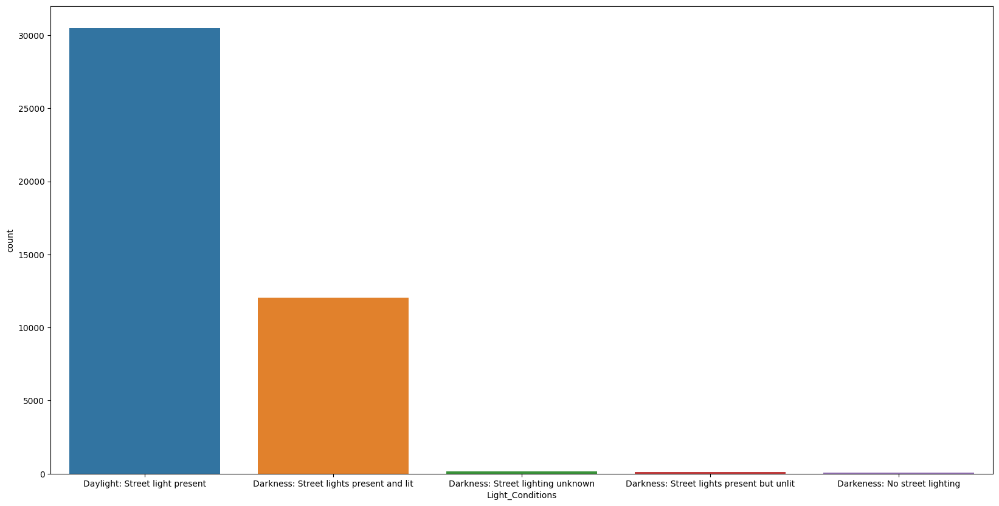

In [35]:
plt.figure(figsize=(20,10))
sns.countplot(df_all_drop,x="Light_Conditions")

<Axes: xlabel='Weather_Conditions', ylabel='count'>

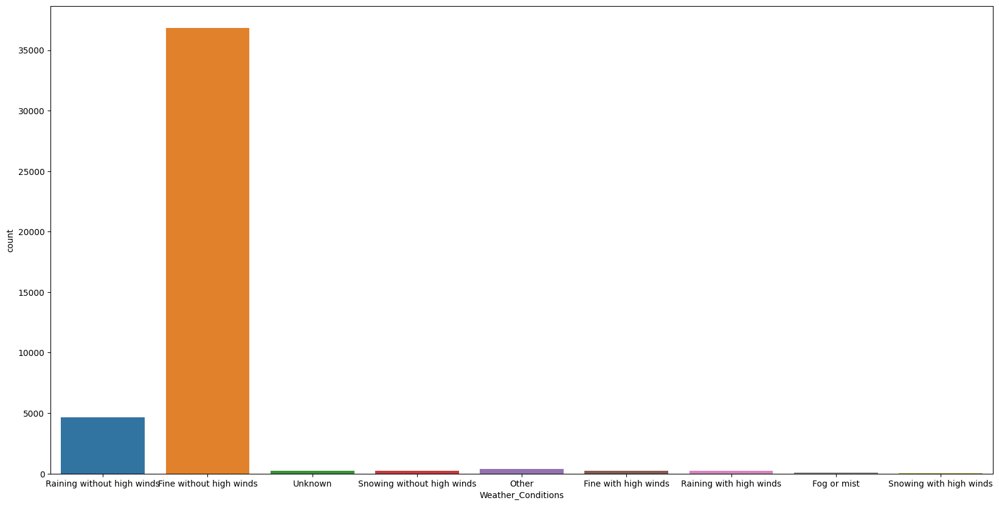

In [36]:
plt.figure(figsize=(20,10))
sns.countplot(df_all_drop,x="Weather_Conditions")